# Поиск изображений по описанию

**Цель работы** — разработать демонстрационную версию сервиса поиска изображений по запросу в рамках Proof of Concept для фотохостинга, используемого профессиональными фотографами. Данный сервис мог бы помочь фотографам в поиске референсных изображений. Необходимо будет оценить, насколько проект по созданию подобного сервиса в принципе осуществим.

Для работы сервиса потребуется разработать модель, определяющую вероятность соответствия конкретных текстовых описаний и картинок.

В некоторых странах, где работает видеохостинг, действуют ограничения по обработке изображений: сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, содержащую описание, изображение или запись голоса детей до 16 лет.
Поэтому в сервисе при появлении в запросе контента, могущего попасть под юридические ограничения, вместо фото должен показывается дисклеймер: *This image is unavailable in your country in compliance with local laws*.

Имеется следующая информация:

* Пары с именами файлов изображений и соответствующими описаниями (до 5 на одну картинку)
* Данные по соответствию изображения и описания, полученные с помощью краудсорсинга
* Данные по соответствию изображения и описания, полученные в результате опроса экспертов
* Собственно сами изображения для обучения и тестирования

**Ход работы**

Загрузим данные и проведём EDA, определимся с единой системой оценивания (таргетом).

Далее подготовим данные к обучению, учитывая законодательные ограничения — векторизируем изображения и тексты.

Обучим несколько моделей определять близость двух векторов — предсказывать итоговую оценку — и выберем наилучшую.

Протестируем качество модели на тестовых данных, а также реализуем и проверим на релевантность результатов реализацию конечной цели проекта — поиска изображений по описанию.

В итоге сформируем общий вывод — опишем итоговую модель и оценим, насколько практически реализуема поставленная задача по созданию подобного проекта.
 
Таким образом работа будет состоять из следующих этапов:

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Загрузка-данных-и-EDA" data-toc-modified-id="Загрузка-данных-и-EDA-1">Загрузка данных и EDA</a></span></li><li><span><a href="#Объединение-оценок" data-toc-modified-id="Объединение-оценок-2">Объединение оценок</a></span></li><li><span><a href="#Подготовка-данных-к-обучению" data-toc-modified-id="Подготовка-данных-к-обучению-3">Подготовка данных к обучению</a></span></li><li><span><a href="#Обучение-моделей-и-определение-лучшей" data-toc-modified-id="Обучение-моделей-и-определение-лучшей-4">Обучение моделей и определение лучшей</a></span></li><li><span><a href="#Тестирование-итоговой-модели-и-демонстрация-её-работы" data-toc-modified-id="Тестирование-итоговой-модели-и-демонстрация-её-работы-5">Тестирование итоговой модели и демонстрация её работы</a></span></li><li><span><a href="#Итоговый-вывод" data-toc-modified-id="Итоговый-вывод-6">Итоговый вывод</a></span></li></ul></div>

## Загрузка данных и EDA

In [ ]:
import os
import re
import random

import numpy as np
import pandas as pd
from PIL import Image
import plotly.express as px
import plotly.graph_objects as go

from tune_sklearn import TuneSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import \
    ShuffleSplit, \
    GridSearchCV, \
    GroupShuffleSplit
from sklearn.preprocessing import MinMaxScaler

import torch
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from torch import nn, optim
from transformers import AutoTokenizer, AutoModel

from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor
from skorch.regressor import NeuralNetRegressor
from skorch.callbacks import EpochScoring, EarlyStopping, LRScheduler

In [ ]:
path = 'C:\\praсtiсum\\unreleased\\half\\image_search_by_description' #укажем
                                                                      #домашнюю
                                                                    #директорию
os.environ['CUBLAS_WORKSPACE_CONFIG']=':4096:8'
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    torch.use_deterministic_algorithms(True)
    torch.backends.cudnn.deterministic = True
SEED = 345678
set_seed(SEED)
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

In [ ]:
train = pd.read_csv(os.path.join(path, 'train_dataset.csv'))
train = train[['query_id', 'query_text', 'image']] # приведём датафреймы
test = pd.read_csv(                                # к общему виду
    os.path.join(path, 'test_queries.csv'),
    sep='|',
    usecols=[1, 2, 3]
    )
test_images = pd.read_csv(os.path.join(path, 'test_images.csv'))
crowd_annotations = pd.read_csv(
    os.path.join(path, 'CrowdAnnotations.tsv'),
    sep='\t',
    header=None,
    names=[
        'image',
        'query_id',
        'matching_ratio',
        'matching_cnt',
        'mismatching_cnt'
        ]
    )
expert_annotations = pd.read_csv(
    os.path.join(path, 'ExpertAnnotations.tsv'),
    sep='\t',
    header=None,
    names=[
        'image',
        'query_id',
        'annotation_1',
        'annotation_2',
        'annotation_3'
        ]
    )
tables = [train, test, test_images, crowd_annotations, expert_annotations]
for table in tables:
    display(
        table.sample(10, random_state=SEED),
        table.info()
        )

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    5822 non-null   object
 1   query_text  5822 non-null   object
 2   image       5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,query_id,query_text,image
189,2358554995_54ed3baa83.jpg#2,A child is preparing to slide down a piece of ...,525863257_053333e612.jpg
3761,3435035138_af32890a4c.jpg#2,A shaggy dog runs down a dirt trail in a lush ...,2595186208_9b16fa0ee3.jpg
5380,2447284966_d6bbdb4b6e.jpg#2,A young boy in a team sweatshirt is in a sport...,3387542157_81bfd00072.jpg
1874,2666179615_f05a9d8331.jpg#2,A woman in a red shirt with her arm raised .,3006093003_c211737232.jpg
3478,2866254827_9a8f592017.jpg#2,A yellow motorcyclist is popping a wheelie .,2526585002_10987a63f3.jpg
2484,3070011270_390e597783.jpg#2,a brown and black dog swimming in a river,3498327617_d2e3db3ee3.jpg
4973,2306674172_dc07c7f847.jpg#2,A skateboarder jumps his board down a flight o...,3518126579_e70e0cbb2b.jpg
4044,3270691950_88583c3524.jpg#2,A man is diving into water near a shore .,3027397797_4f1d305ced.jpg
717,3004823335_9b82cbd8a7.jpg#2,"A dog in a grassy field , looking up .",468310111_d9396abcbd.jpg
1218,3123351642_3794f2f601.jpg#2,A snowboarder jumps high in the air over a sno...,3354330935_de75be9d2f.jpg


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 11.8+ KB


,query_id,query_text,image
309,3386953179_84c2d7922f.jpg#4,Skier in red skiing down a snowy mountain .,3386953179_84c2d7922f.jpg
402,3601978895_9fec23ce0c.jpg#2,Two men are standing under what looks to be a ...,3601978895_9fec23ce0c.jpg
208,3036971334_78187a9570.jpg#3,People stand by a rocky cliff with water below .,3036971334_78187a9570.jpg
78,2201192417_d934730fea.jpg#3,A little boy wearing a green soccer strip is r...,2201192417_d934730fea.jpg
348,345785626_9fa59f38ce.jpg#3,"A young man sits on a cliff , watching the oce...",345785626_9fa59f38ce.jpg
300,3356748019_2251399314.jpg#0,Cyclists are leaping into the air whilst being...,3356748019_2251399314.jpg
332,3435015880_eda46ff50f.jpg#2,Two people are running at the top of a mountain .,3435015880_eda46ff50f.jpg
275,3247693965_845b3b4349.jpg#0,A dog in a harness pulling a pink carrier behi...,3247693965_845b3b4349.jpg
310,3393035454_2d2370ffd4.jpg#0,a boy in a blue top is jumping off some rocks ...,3393035454_2d2370ffd4.jpg
371,3488087117_2719647989.jpg#1,A little white dog in running on the sidewalk .,3488087117_2719647989.jpg


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


,image
19,3653484549_f316590b0f.jpg
4,1177994172_10d143cb8d.jpg
80,1991806812_065f747689.jpg
28,2201192417_d934730fea.jpg
90,3386953179_84c2d7922f.jpg
54,2714674623_8cd05ac114.jpg
27,3287969199_08e775d896.jpg
87,2552438538_285a05b86c.jpg
46,3351418768_596ef7fd6f.jpg
77,973827791_467d83986e.jpg


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            47830 non-null  object 
 1   query_id         47830 non-null  object 
 2   matching_ratio   47830 non-null  float64
 3   matching_cnt     47830 non-null  int64  
 4   mismatching_cnt  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,image,query_id,matching_ratio,matching_cnt,mismatching_cnt
10194,2384353160_f395e9a54b.jpg,2061144717_5b3a1864f0.jpg#2,0.000000,0,3
27151,3203453897_6317aac6ff.jpg,463978865_c87c6ca84c.jpg#2,0.000000,0,3
13486,2526585002_10987a63f3.jpg,1808370027_2088394eb4.jpg#2,0.000000,0,4
6044,2102360862_264452db8e.jpg,3110649716_c17e14670e.jpg#2,0.000000,0,3
13244,2518508760_68d8df7365.jpg,3467219837_7d62213dec.jpg#2,0.333333,1,2
39379,3619416477_9d18580a14.jpg,3347666612_659e6e2207.jpg#2,0.000000,0,3
10469,241031254_0c6f30e3d1.jpg,872622575_ba1d3632cc.jpg#2,0.000000,0,3
108,1082379191_ec1e53f996.jpg,2544426580_317b1f1f73.jpg#2,0.000000,0,3
18698,2842865689_e37256d9ce.jpg,3287549827_04dec6fb6e.jpg#2,0.000000,0,3
29711,3263395801_5e4cee2b9e.jpg,300550441_f44ec3701a.jpg#2,0.000000,0,3


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image         5822 non-null   object
 1   query_id      5822 non-null   object
 2   annotation_1  5822 non-null   int64 
 3   annotation_2  5822 non-null   int64 
 4   annotation_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


,image,query_id,annotation_1,annotation_2,annotation_3
189,1322323208_c7ecb742c6.jpg,2603792708_18a97bac97.jpg#2,2,3,3
3761,3320032226_63390d74a6.jpg,3301811927_a2797339e5.jpg#2,1,1,1
5380,494792770_2c5f767ac0.jpg,3245460937_2710a82709.jpg#2,1,1,1
1874,2612488996_9450de0e54.jpg,2815256108_fc1302117d.jpg#2,1,1,1
3478,3232470286_903a61ea16.jpg,2657484284_daa07a3a1b.jpg#2,1,1,1
2484,2909875716_25c8652614.jpg,2890113532_ab2003d74e.jpg#2,2,2,2
4973,3708177171_529bb4ff1d.jpg,3323988406_e3c8fce690.jpg#2,2,2,3
4044,3425851292_de92a072ee.jpg,3359530430_249f51972c.jpg#2,1,1,1
717,2075321027_c8fcbaf581.jpg,3295391572_cbfde03a10.jpg#2,1,1,1
1218,2345984157_724823b1e4.jpg,3048597471_5697538daf.jpg#2,3,3,3


None

In [ ]:
for table in [crowd_annotations, expert_annotations]:
    display(table.describe())

,matching_ratio,matching_cnt,mismatching_cnt
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


,annotation_1,annotation_2,annotation_3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


Пропусков нет, проверим датафреймы на дубликаты.

In [ ]:
for table in tables:
    print(table.duplicated().sum())

0
0
0
0
0


Оценим также количество уникальных изображений и запросов в датасетах.

In [ ]:
print(
    'Количество уникальных изображений и запросов в тренировочном датасете:',
    f'{len(train.query_text.unique())} — {len(train.image.unique())}'
    )
print(
    'Количество уникальных изображений и запросов в тестовом датасете:',
    f'{len(test.query_text.unique())} — {len(test.image.unique())}'
    )

Количество уникальных изображений и запросов в тренировочном датасете: 977 — 1000
Количество уникальных изображений и запросов в тренировочном датасете: 500 — 100


Ознакомительно взглянем на пары описаний и изображений.

A child is preparing to slide down a piece of playground equipment .



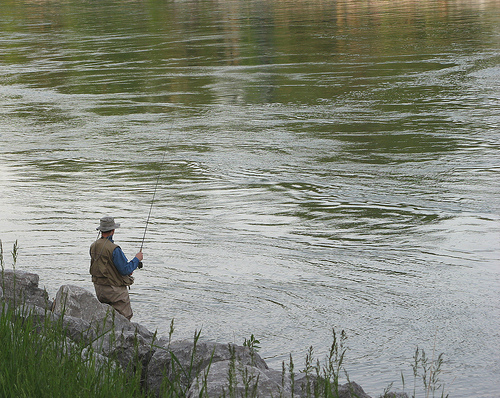



A shaggy dog runs down a dirt trail in a lush forest .



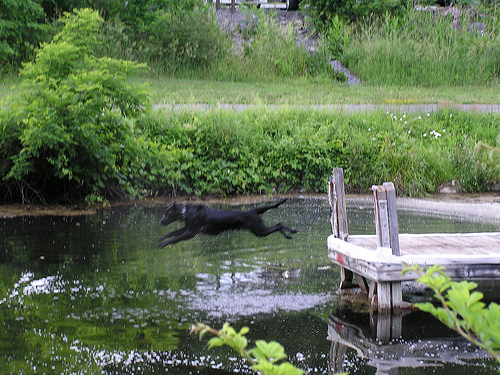



A young boy in a team sweatshirt is in a sports stadium near blue seats swinging a red bat .



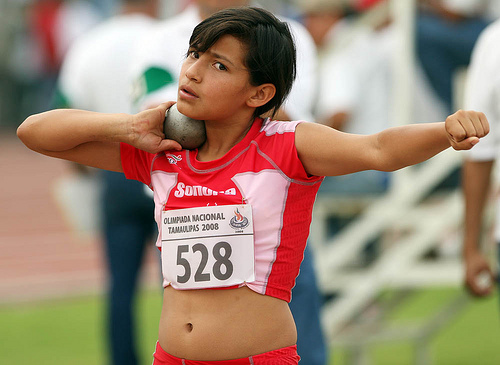



A woman in a red shirt with her arm raised .



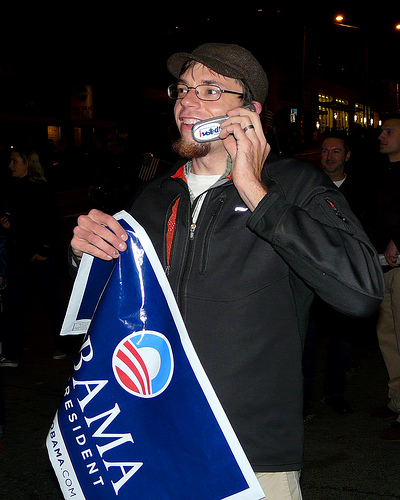



A yellow motorcyclist is popping a wheelie .



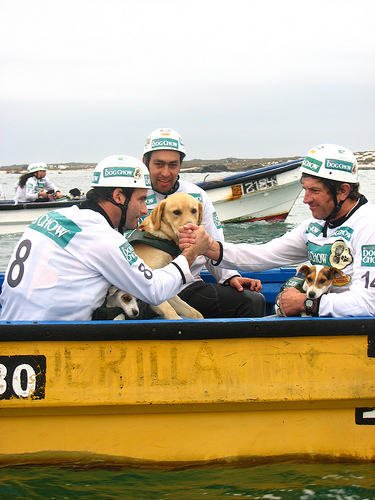

In [ ]:
for i, row in train.sample(5, random_state=SEED).iterrows():
    print(row.query_text)
    img_path = os.path.join(path, 'train_images', row.image)
    img_data = np.array(Image.open(img_path))
    px.imshow(img_data). \
        update_xaxes(showticklabels = False). \
        update_yaxes(showticklabels = False).show()
    print('\n')

**Промежуточные выводы**

При имеющихся 5822 тренировочных примерах уникальных запросов и изображений всего примерно по 1000 штук, вероятно, из них случайно составлены пары. В тестовом же датасете, по всей видимости, на каждое из 100 изображений приходится по 5 текстовых описаний, каждое из которых уникально для всего датасета.

Учитывая одинаковое количество записей в датасете для обучения и в датасете с экспертными оценками, примерно в 10 раз большее количество записей в датасете с оценками с краудсорсинга, а также сильно меньшее сопоставимое среднее значение схожести пар в последнем, можно предположить, что на краудсорсинге, по всей видимости, респонденты либо оценивали не только сочетания уникальных запросов и изображений, а сочетания разных описаний ко всем изображениям и изображений (в итоге уникальные описания повторялись). Либо же просто датасет с их оценками был собран таким неэффективным способом.

Сами текстовые описания и изображения на первый взгляд бывают достаточно разной степени детализированности — короткие или же подробные запросы, фото с малым количеством крупных объектов или же с многими более мелкими. Можно предположить, что моделям сложнее будет точно определить более мелкие детали. Изображения разного размера, для получения эмбеддингов потребуется привести их все к одному.

Тренировочные данные изначально расположены в трёх отдельных датасетах, для дальнейшей работы нам понадобится объединить их в один, сначала объединив оценки из разных источников, после чего уже добавить итоговую к самим тренировочным парам.

## Объединение оценок

Для большей информативности данных при вычислении одной общей оценки соответствия изображений и текстов используем также и оценки, полученные на краудсорсинге. Добавим их к датасету с экспертыми оценками, после чего определим итоговый показатель как средневзвешенное значение четырёх чисел, присвоив оценке с краудсорсинга меньший вес, чем оценке эксперта. Так как модель должна в итоге предсказвать вероятность соответствия, приведём все оценки к диапазону от 0 до 1.

In [ ]:
united_annotations = pd.merge(
    expert_annotations,
    crowd_annotations,
    on=['image', 'query_id'],
    how='left'
    ).drop(['matching_cnt', 'mismatching_cnt'], axis=1)
    
scaler = MinMaxScaler()
united_annotations[[
    'annotation_1',
    'annotation_2',
    'annotation_3'
    ]] = scaler.fit_transform(united_annotations[[
        'annotation_1',
        'annotation_2',
        'annotation_3'
        ]])
weights = {
    'annotation_1': 0.27,
    'annotation_2': 0.27,
    'annotation_3': 0.27,
    'matching_ratio': 0.19
    }
united_annotations['final_annotation'] = united_annotations.loc[
    :,
    'annotation_1':'matching_ratio'
    ].apply(
        lambda x: np.average(
            x.dropna(),
            weights=[weights[k] for k in x.dropna().index]
            ),
        axis=1
        )
united_annotations.sample(10, random_state=SEED)

,image,query_id,annotation_1,annotation_2,annotation_3,matching_ratio,final_annotation
189,1322323208_c7ecb742c6.jpg,2603792708_18a97bac97.jpg#2,0.333333,0.666667,0.666667,NaN,0.555556
3761,3320032226_63390d74a6.jpg,3301811927_a2797339e5.jpg#2,0.000000,0.000000,0.000000,NaN,0.000000
5380,494792770_2c5f767ac0.jpg,3245460937_2710a82709.jpg#2,0.000000,0.000000,0.000000,NaN,0.000000
1874,2612488996_9450de0e54.jpg,2815256108_fc1302117d.jpg#2,0.000000,0.000000,0.000000,NaN,0.000000
3478,3232470286_903a61ea16.jpg,2657484284_daa07a3a1b.jpg#2,0.000000,0.000000,0.000000,NaN,0.000000
2484,2909875716_25c8652614.jpg,2890113532_ab2003d74e.jpg#2,0.333333,0.333333,0.333333,NaN,0.333333
4973,3708177171_529bb4ff1d.jpg,3323988406_e3c8fce690.jpg#2,0.333333,0.333333,0.666667,0.333333,0.423333
4044,3425851292_de92a072ee.jpg,3359530430_249f51972c.jpg#2,0.000000,0.000000,0.000000,NaN,0.000000
717,2075321027_c8fcbaf581.jpg,3295391572_cbfde03a10.jpg#2,0.000000,0.000000,0.000000,NaN,0.000000
1218,2345984157_724823b1e4.jpg,3048597471_5697538daf.jpg#2,0.666667,0.666667,0.666667,0.333333,0.603333


In [ ]:
train = pd.merge(
    train,
    united_annotations[['image', 'query_id', 'final_annotation']],
    on=['image', 'query_id']
    )
display(
    train.sample(10, random_state=SEED),
    train.info()
    )

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   query_id          5822 non-null   object 
 1   query_text        5822 non-null   object 
 2   image             5822 non-null   object 
 3   final_annotation  5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 227.4+ KB


,query_id,query_text,image,final_annotation
189,2358554995_54ed3baa83.jpg#2,A child is preparing to slide down a piece of ...,525863257_053333e612.jpg,0.000000
3761,3435035138_af32890a4c.jpg#2,A shaggy dog runs down a dirt trail in a lush ...,2595186208_9b16fa0ee3.jpg,0.444444
5380,2447284966_d6bbdb4b6e.jpg#2,A young boy in a team sweatshirt is in a sport...,3387542157_81bfd00072.jpg,0.000000
1874,2666179615_f05a9d8331.jpg#2,A woman in a red shirt with her arm raised .,3006093003_c211737232.jpg,0.111111
3478,2866254827_9a8f592017.jpg#2,A yellow motorcyclist is popping a wheelie .,2526585002_10987a63f3.jpg,0.000000
2484,3070011270_390e597783.jpg#2,a brown and black dog swimming in a river,3498327617_d2e3db3ee3.jpg,0.910000
4973,2306674172_dc07c7f847.jpg#2,A skateboarder jumps his board down a flight o...,3518126579_e70e0cbb2b.jpg,0.777778
4044,3270691950_88583c3524.jpg#2,A man is diving into water near a shore .,3027397797_4f1d305ced.jpg,0.090000
717,3004823335_9b82cbd8a7.jpg#2,"A dog in a grassy field , looking up .",468310111_d9396abcbd.jpg,0.333333
1218,3123351642_3794f2f601.jpg#2,A snowboarder jumps high in the air over a sno...,3354330935_de75be9d2f.jpg,0.576667


None

Посмотрим на распределение получившейся итоговой целевой переменной.

In [ ]:
px.histogram(
    train,
    x='final_annotation',
    marginal='box',
    nbins=20
    ).update_layout(
        width=1000,
        height=500,
        xaxis_title='Степень соответствия',
        yaxis_title='Количество изображений',
        title=dict(
            text='Распределение оценок соответствия фото описанию',
            x=.5
            )
        ).show()

**Промежуточные выводы**

Распределение получившейся целевой переменной выглядит правдоподобно, ожидаемо больше всего оценок с полным несоответствием, с увеличением же показателя количество соответствующих аннотаций последовательно падает, но полностью подходящих пар не меньше всего, их количество выше, чем у оставшихся оценок выше 0.5. В целом же, конечно, подобный характер распределения обучающих данных затруднит моделям качественное определение и, соответственно, предсказание случаев, когда фото скорее соответствует описанию, так как подобных примеров достаточно мало.

## Подготовка данных к обучению

Для начала исключим из датасета пары, могущие подпадать под юридические ограничения, упомянутые выше, определив для этого изображения детей на основе наличия в релевантных описаниях сответствующих слов, обозначающих детей.

Далее векторизируем тексты и изображения с помощью моделей-трансформеров, объединим векторы в один итоговый, который будем передавать предсказывающей модели, и разделим данные на тренировочную и тестовую выборки таким образом, чтобы одни и те же изображения не оказались в обоих выборках одновременно.

In [ ]:
stop = [
'child',
'kid',
'infant',
'preemie',
'newborn',
'suckler'
'bairn',
'bab',
'bubb',
'tot',
'toddler',
'preschooler',
'preteen',
'tween',
'boy',
'girl'
]
def preprocessing(df, text_col, image_col, words):
    mask = df[text_col].str.contains('|'.join(words), case=False)
    sec_mask = df[image_col].isin(
        df[mask].query('final_annotation >= .5')[image_col]
        )
    df = df[~sec_mask].reset_index(drop=True)
    df[text_col] = df[text_col].apply(lambda x: re.sub(r'\s+', ' ', x).strip())
    return df
    
train = preprocessing(train, 'query_text', 'image', stop)
mask = train.query_text.str.contains('|'.join(stop), case=False)
sec_mask = train.image.isin(
    train[mask].query('final_annotation >= .5').image
    )
if sec_mask.any():
    print('В данных остались примеры, могущие попасть под юридические ограничения')
else:
    print('Данные соответствуют законодательству')

Данные соответствуют законодательству


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5212 entries, 0 to 5211
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   query_id          5212 non-null   object 
 1   query_text        5212 non-null   object 
 2   image             5212 non-null   object 
 3   final_annotation  5212 non-null   float64
dtypes: float64(1), object(3)
memory usage: 163.0+ KB


Для получения текстовых эмбеддингов воспользуемся одной из моделей трансформеров для задач определения сходства текстов, так как перед нами стоит аналогичная задача, пусть и домены в данном случае разные. Для ускорения обучения выберем мини-реализацию, выдающую эмбеддинги размера 384, в том числе так как наши тексты также достаточно миниатюрны.

In [ ]:
def obtaining_text_embeddings(df, tokenizer, model, batch_size):
    tokens = torch.LongTensor(df.query_text.apply(lambda x: tokenizer.encode(
        x,
        add_special_tokens=True,
        padding='max_length',
        truncation=True
        ))).to(device)
    attention_mask = torch.where(tokens != 0, 1, 0).to(device)

    query_embeddings = []
    loader = DataLoader(
        list(zip(tokens, attention_mask)),
        batch_size=batch_size
        )
    for batch in loader:
        token_batch, attention_mask_batch = batch
        with torch.no_grad():
            output = model(
                token_batch,
                attention_mask=attention_mask_batch
                )
        query_embeddings.append(output[0][:,0,:].cpu().numpy())
        
    return np.concatenate(query_embeddings)

tokenizer = AutoTokenizer.from_pretrained(
    'sentence-transformers/all-MiniLM-L6-v2'
    )
lat = AutoModel.from_pretrained(
    'sentence-transformers/all-MiniLM-L6-v2'
    ).to(device)
train_query_embeddings = obtaining_text_embeddings(
    train,
    tokenizer,
    lat,
    700
    )
print(
    'Размер текстовых эмбеддингов: ',
    train_query_embeddings.shape
    )

Размер текстовых эмбеддингов:  (5212, 384)


Эмбеддинги изображений приготовим с помощью одного из трансформеров для получения представлений изображений, предобученного на датасете *ImageNet-21k*, с большим размером патча 32х32 для повышенной точности, на выходе получим эмбеддинги размера 768, так же, как и в случае использования модели с патчем 16х16.

In [ ]:
class DFDataset(Dataset):
    def __init__(self, df, dir, transform=None):
        self.df = df
        self.dir = dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        file = row.image
        path = os.path.join(self.dir, file)
        image = Image.open(path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

def obtaining_img_embeddings(df, dir, model, batch_size):
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
            )
        ])
    dataset = DFDataset(df, dir, transform=preprocess)
    loader = DataLoader(dataset, batch_size=batch_size)
    image_embeddings = []

    with torch.no_grad():
        for batch in loader:
            batch = batch.to(device)
            output = model(batch)
            image_embeddings.append(output[0][:,0,:].cpu().numpy())
            
    return np.concatenate(image_embeddings)

vit = AutoModel.from_pretrained('google/vit-base-patch32-224-in21k').to(device)
train_image_embeddings = obtaining_img_embeddings(
    train,
    'train_images',
    vit,
    1000
    )
print(
    'Размер эмбеддингов изображений: ',
    train_image_embeddings.shape
    )

Размер эмбеддингов изображений:  (5212, 768)


Создадим выборки, объединив полученные выше эмбеддинги текстов и изображений.

In [ ]:
features = np.hstack((train_query_embeddings, train_image_embeddings))
target = train.final_annotation

gss = GroupShuffleSplit(n_splits=1, test_size=.1, random_state=SEED)
train_idxs, test_idxs = next(gss.split(
    X=features,
    y=target,
    groups=train.image
    ))
train_features, test_features = features[train_idxs], features[test_idxs]
train_target, test_target = target[train_idxs], target[test_idxs]

print(
    'Размеры тренировочной и тестовой выборок с эмбеддингами: ',
    train_features.shape,
    test_features.shape,
    '\n',
    'Размеры тренировочной и тестовой выборок с целевым признаком: ',
    train_target.shape,
    test_target.shape,
    '\n',
    'Количество одинаковых изображений в выборках: ',
    train.image[train_idxs].isin(train.image[test_idxs]).sum(),
    sep=''
    )

Размеры тренировочной и тестовой выборок с эмбеддингами: (4684, 1152)(528, 1152)
Размеры тренировочной и тестовой выборок с целевым признаком: (4684,)(528,)
Количество одинаковых изображений в выборках: 0


**Промежуточные выводы**

После обработки для соответствия юридическим нормам тренировочные данные уменьшились примерно на 10%.

Эмбеддинги запросов и изображений, как и итоговые выборки для обучения, успешно получены.

## Обучение моделей и определение лучшей

Сравним следующие разные модели: линейную регресию в качестве бейзлайна, градиентный бустинг, а также полносвязную нейронную сеть. Подберём наиболее оптимальные гиперпараметры и выберем лучшую. Метрикой качества установим **RMSE**, так как нам более важны значительные ошибки, могущие обозначать то, что модель будет считать в целом нерелевантные пары скорее релевантными и наоборот, а изначальная **MSE** недостаточно хорошо интерпретируема.

In [ ]:
metrics = pd.DataFrame(
    index=['RMSE'],
    columns=['LR', 'GB', 'NN']
    )
ss = ShuffleSplit(n_splits=5, test_size=.2, random_state=SEED)

In [ ]:
lr_params = {}
lr_model=LinearRegression(n_jobs=-1)
best_lr_model = GridSearchCV(
    lr_model,
    lr_params,
    scoring='neg_root_mean_squared_error',
    cv=ss,
    n_jobs=-1
    )
best_lr_model.fit(train_features, train_target)
metrics.loc['RMSE', 'LR'] = -best_lr_model.best_score_

In [ ]:
%%time
gb_params = {
    'boosting_type': ['gbdt', 'dart', 'goss'],
    'n_estimators': list(range(500, 1001)),
    'min_child_samples': list(range(10, 31)),
    'learning_rate': (.01, .16)
    }
gb_model = LGBMRegressor(
    random_state=SEED,
    force_col_wise=True
    )
best_gb_model = TuneSearchCV(
    gb_model,
    gb_params,
    scoring='neg_root_mean_squared_error',
    cv=ss,
    random_state=SEED,
    n_trials=100,
    n_jobs=-1,
    early_stopping=False,
    search_optimization='hyperopt'
    )
best_gb_model.fit(train_features, train_target)
metrics.loc['RMSE', 'GB'] = -best_gb_model.best_score_
print(
    'Лучшие параметры для градиентного бустинга:',
    best_gb_model.best_params_
    )

Лучшие параметры для градиентного бустинга: {'boosting_type': 'dart', 'learning_rate': 0.12768250614166568, 'min_child_samples': 17, 'n_estimators': 968}
CPU times: total: 5min 28s
Wall time: 1h 25min 14s


In [ ]:
f_train = torch.FloatTensor(train_features)
f_test = torch.FloatTensor(test_features)

t_train = torch.FloatTensor(train_target.values).reshape(-1, 1)
t_test = torch.FloatTensor(test_target.values).reshape(-1, 1)

In [ ]:
class Net(nn.Module):
    def __init__(
        self,
        n_hidden_neurons,
        n_in_neurons=1152,
        n_out_neurons=1
        ):
        super().__init__()

        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons)
        self.bn = nn.BatchNorm1d(n_hidden_neurons)
        self.act = nn.ReLU()

        self.fc2 = nn.Linear(n_hidden_neurons, n_out_neurons)
        self.sig = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.bn(x)
        x = self.act(x)

        x = self.fc2(x)
        x = self.sig(x)
        return x

net = NeuralNetRegressor(
    module=Net,
    verbose=0,
    lr=5e-2,
    batch_size=-1,
    optimizer=optim.RAdam,
    max_epochs=1000,
    callbacks=[
        EpochScoring(
            scoring='neg_root_mean_squared_error',
            lower_is_better=False,
            name='RMSE'
            ),
        EarlyStopping(
            lower_is_better=False,
            monitor='RMSE',
            patience=30,
            load_best=True
            ),
        LRScheduler(
            policy=optim.lr_scheduler.CosineAnnealingWarmRestarts,
            monitor='RMSE',
            T_0=15
            )
        ]
    )

In [ ]:
%%time
nn_params = {
    'module__n_hidden_neurons': list(range(10, 500)),
    'optimizer__weight_decay': [0, 1e-2, 4e-2, 7e-2, 1e-1],
    'optimizer__eps': [1e-8, 1e-6]
    }
best_nn_model = TuneSearchCV(
    net,
    nn_params,
    scoring='neg_root_mean_squared_error',
    cv=ss,
    n_trials=500,
    n_jobs=-1,
    random_state=SEED,
    search_optimization='bohb'
    )
best_nn_model.fit(f_train, t_train)
metrics.loc['RMSE', 'NN'] = -best_nn_model.best_score_
print(
    'Лучшие параметры для нейронной сети:',
    best_nn_model.best_params_
    )

Лучшие параметры для нейронной сети: {'module__n_hidden_neurons': 476, 'optimizer__eps': 1e-06, 'optimizer__weight_decay': 0}
CPU times: total: 1min 32s
Wall time: 50min 12s


In [ ]:
metrics

,LR,GB,NN
RMSE,0.261165,0.192415,0.182923


Лучший показатель метрики можно наблюдать у нейронной сети, её и выберем в качестве итогового решения.

## Тестирование итоговой модели и демонстрация её работы

Проверим качество работы полученной модели на тестовых данных. Проверим также наиболее интерпретируемую метрику **MAE**, чтобы понять, на какую вероятность в среднем ошибается модель.

In [ ]:
n_predictions = best_nn_model.predict(f_test).flatten()
print(
    'RMSE на тестовых данных',
    mean_squared_error(t_test, n_predictions, squared=False).round(3))
print(
    'MAE на тестовых данных',
    mean_absolute_error(t_test, n_predictions).round(3)
    )

RMSE на тестовых данных 0.188
MAE на тестовых данных 0.128


In [ ]:
test_target = test_target.reset_index(drop=True)
ids = np.argsort(test_target)
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=np.arange(test_target.size),
    y=n_predictions[ids],               # для удобства интерпритации
    name='Предсказания',                # отобразим тестовые примеры
    line=dict(color='crimson', width=2) # по возрастанию вероятности
    ))
fig.add_trace(go.Scatter(
    x=np.arange(test_target.size),
    y=test_target[ids],
    name='Настоящая вероятность',
    line=dict(color='darkblue', width=2)
    ))
fig.update_layout(
    width=1200,
    height=600,
    legend_orientation='h',
    title=dict(
        text='Предсказанная вероятность соответствия фото описанию по сравнению с настоящей',
        x=.5
        ),
    xaxis_title='Тестовый пример',
    yaxis_title='Вероятность соответствия'
    )
fig.show()

Продемонстрируем реализацию изначального итогового запроса — к 10 случайным текстовым описаниям выведем соответствующие им предсказанные моделью изображения.

In [ ]:
def obtaining_image(
    text_df,
    img_df,
    dir,
    text_model,
    tokenizer,
    img_model,
    predict_model,
    text_bs,
    img_bs,
    stop_words
    ):
    text_df = text_df.copy()
    stop_words_regex = '|'.join(stop_words)
    mask = text_df.query_text.str.contains(stop_words_regex, case=False)

    for i, row in text_df[mask].iterrows():
        print(row.query_text)
        print('— This image is unavailable in your country in compliance with local laws.', '\n')
    text_df = text_df[~mask].reset_index(drop=True)
    text_df.query_text = text_df.query_text.apply(lambda x: re.sub(r'\s+', ' ', x).strip())

    if len(text_df) == 0:
        return

    text_embeddings = obtaining_text_embeddings(
        text_df,
        tokenizer,
        text_model,
        text_bs
        )
    img_embeddings = obtaining_img_embeddings(
        img_df,
        dir,
        img_model,
        img_bs
        )
    for i in range(len(text_embeddings)):
        max_prob = 0
        matched_img = None
        for j in range(len(img_embeddings)):
            joint_emb = np.concatenate((text_embeddings[i], img_embeddings[j]))
            prob = predict_model.predict(joint_emb.reshape(1,-1))
            if prob > max_prob:
                max_prob = prob
                matched_img = j

        print(text_df.query_text[i])
        print(
            'An image that matches the description, with a probability of',
            f'{max_prob[0][0]:.2f}:'
            )
        img_name = img_df.image[matched_img]
        img_path = os.path.join(dir, img_name)
        img_data = np.array(Image.open(img_path))
        px.imshow(img_data). \
            update_xaxes(showticklabels = False). \
            update_yaxes(showticklabels = False).show()
        print('\n')

A little boy wearing a green soccer strip is running on the grass .
— This image is unavailable in your country in compliance with local laws. 

a boy in a blue top is jumping off some rocks in the woods .
— This image is unavailable in your country in compliance with local laws. 

Skier in red skiing down a snowy mountain .
An image that matches the description, with a probability of 0.56:



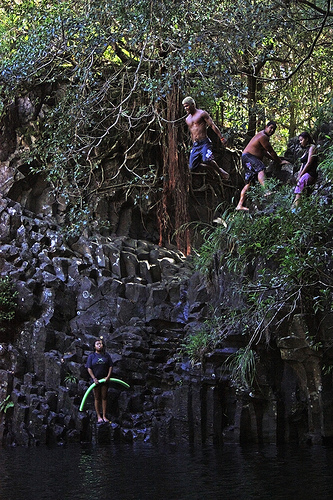



Two men are standing under what looks to be a giant robot .
An image that matches the description, with a probability of 0.51:



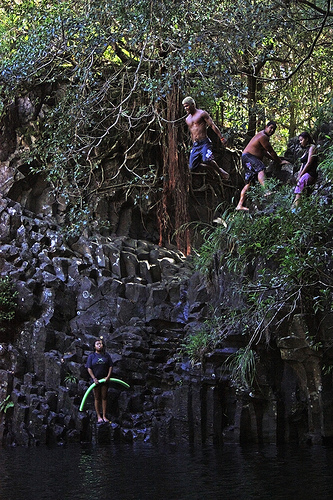



People stand by a rocky cliff with water below .
An image that matches the description, with a probability of 0.81:



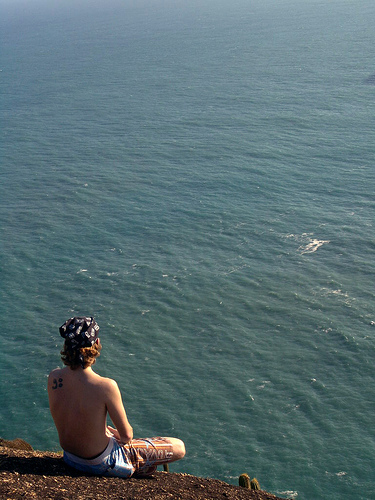



A young man sits on a cliff , watching the ocean .
An image that matches the description, with a probability of 0.61:



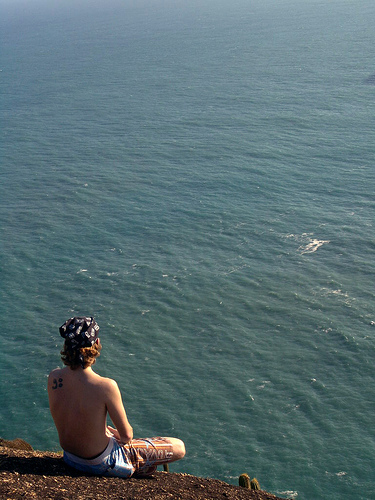



Cyclists are leaping into the air whilst being watched by spectators .
An image that matches the description, with a probability of 0.39:



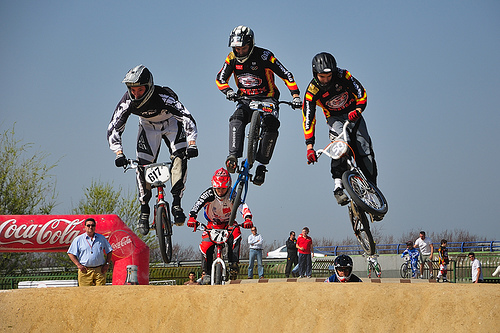



Two people are running at the top of a mountain .
An image that matches the description, with a probability of 0.65:



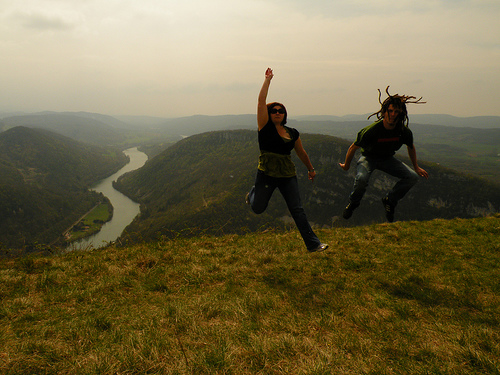



A dog in a harness pulling a pink carrier behind it on snow .
An image that matches the description, with a probability of 0.54:



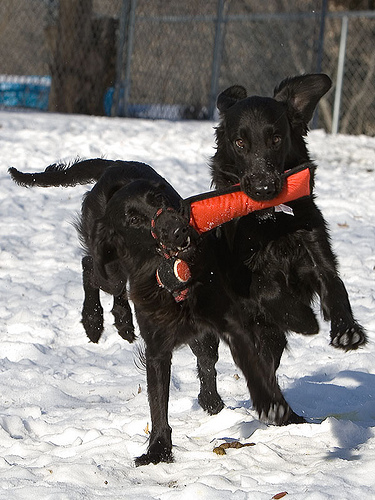



A little white dog in running on the sidewalk .
An image that matches the description, with a probability of 0.50:



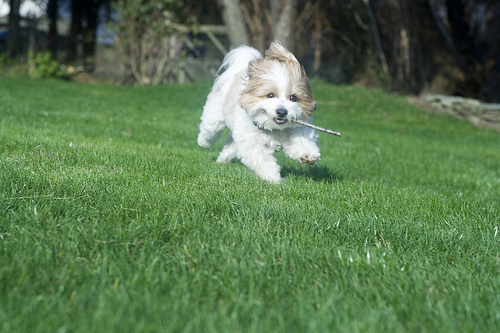

In [ ]:
obtaining_image(
    test.sample(10, random_state=SEED),
    test_images,
    'test_images',
    lat,
    tokenizer,
    vit,
    best_nn_model,
    1,
    100,
    stop
)

## Итоговый вывод

Несмотря на довольно неплохие низкие показатели офлайн-метрик итоговое визуальное качество предсказаний модели можно назвать достаточно посредственным. Выше можно увидеть как примеры точных предсказаний (маленькая собака, люди на горе, мотоциклисты), так и таких, где модель верно определяет только часть описания (собака с розовой упряжкой и люди у горного обрыва), не сумев выявить остальные более глубокие детали или спутав их, а также и в целом ошибочные примеры (мужчины у робота, лыжник). Вероятно, модели не хватает более глубокого и точного представления описаний/изображений.

По графику сравнения предсказаний и истинных значений видно, что модель, к сожалению, достаточно плохо предсказывает вероятность соответствия пар выше 0.8, что вполне ожидаемо, учитывая малое количество соответственных примеров в тренировочных данных.

В целом можно сказать, что проект по созданию предлагаемого сервиса поиска изображений по описанию практически осуществим, но для качественной работы явно требуется дальнейшая доработка качества предсказаний модели. Для достижения этой цели в числе прочего можно поробовать использовать другие алгоритмы для получения эмбеддингов, предоставить модели в обучающих данных больше примеров пар релвантных описаний и изображений, а также, возможно, усложнить нейронный классификатор путём добавления большего количества слоёв.